
# Fighter Jet recognizer
The goal of this project is to classify 26 different types of Fighter Aircrafts around the world. The types are following: <br/>
1. General Dynamics F-16 Fighting Falcon aircraft
2. Mikoyan MiG-29
3. Dassault Rafale
4. Lockheed Martin F-22 Raptor
5. Mikoyan Mig-31
6. Sukhoi Su-27
7. Lockheed Martin F-35 Lightning II
8. KAI KF-21 Boramae
9. Sukhoi Su-57
10. Shenyang FC-31 Gyrfalcon
11. Boeing F-15EX Eagle II
12. Eurofighter Typhoon
13. AIDC F-CK-1 Ching-kuo
14. Lockheed YF-12
15. Mikoyan MiG-31
16. McDonnell Douglas F-4 Phantom II
17. Grumman F-14 Tomcat
18. English Electric Lightning
19. Focke-Wulf Fw 190
20. Mikoyan-Gurevich MiG-25
21. Lockheed P-80 Shooting Star
22. Sukhoi Su-34
23. Chengdu J-20
24. Sukhoi Su-35
25. Chengdu J-10
26. Mikoyan MiG-35

# Setting Up Necessary Things

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline 
bs = 32 # batch size 
version = 1

In [ ]:
!pip install -Uqq fastai

In [2]:
from fastai import *
from fastai.vision.all import *
from fastai.vision.widgets import *

# Fetch Data

In [4]:
data_path = "data10"
dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files,                        # get_image_files returns a list of all images in that path recursively by default
    splitter=RandomSplitter(valid_pct=0.1, seed=42),  # getting 90-10 train-validation split
    get_y=parent_label,                               # taking the folder name as labels
    item_tfms=Resize(128))                            # resizing to get the image of same shape

In [26]:
dls.train.vocab

[autoreload of pygments.token failed: Traceback (most recent call last):
  File "C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\IPython\extensions\autoreload.py", line 261, in check
    superreload(m, reload, self.old_objects)
  File "C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\IPython\extensions\autoreload.py", line 484, in superreload
    update_generic(old_obj, new_obj)
  File "C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\IPython\extensions\autoreload.py", line 381, in update_generic
    update(a, b)
  File "C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\IPython\extensions\autoreload.py", line 349, in update_class
    update_instances(old, new)
  File "C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\IPython\extensions\autoreload.py", line 307, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: __class__ assignment: '_TokenType' object layout differs from '_TokenType'
]
[autoreload of pygments.style failed: Traceback (most recent

['AIDC F-CK-1 Ching-kuo', 'Boeing F-15EX Eagle II', 'Chengdu J-10 (China)', 'Chengdu J-20 (China)', 'Dassault Rafale', 'English Electric Lightning', 'Eurofighter Typhoon', 'Focke-Wulf Fw 190', 'General Dynamics F-16 Fighting Falcon aircraft', 'Grumman F-14 Tomcat', 'KAI KF-21 Boramae', 'Lockheed Martin F-22 Raptor', 'Lockheed Martin F-35 Lightning II', 'Lockheed P-80 Shooting Star', 'Lockheed YF-12', 'McDonnell Douglas F-4 Phantom II', 'Mikoyan MiG-29', 'Mikoyan Mig-31', 'Mikoyan-Gurevich MiG-25', 'Shenyang FC-31 Gyrfalcon', 'Sukhoi Su-27', 'Sukhoi Su-35 (Russia)', 'Sukhoi Su-57']

In [19]:
dblock = dblock.new(item_tfms=RandomResizedCrop(224, min_scale=0.5), batch_tfms=aug_transforms())
dls = dblock.dataloaders(data_path, bs = bs)
torch.save(dls, f"Final.pkl")

In [20]:
dls = torch.load(f"models/Final.pkl")

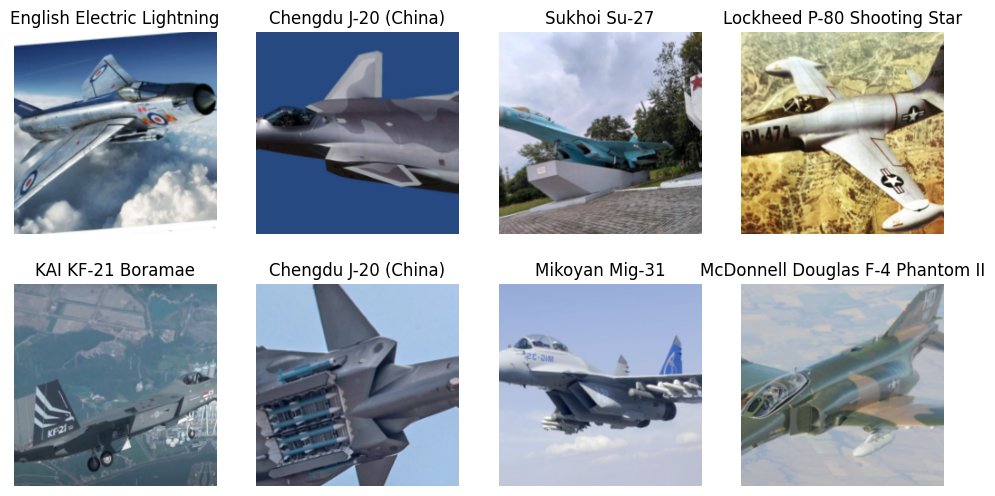

In [7]:
dls.train.show_batch(max_n=8, nrows=2)

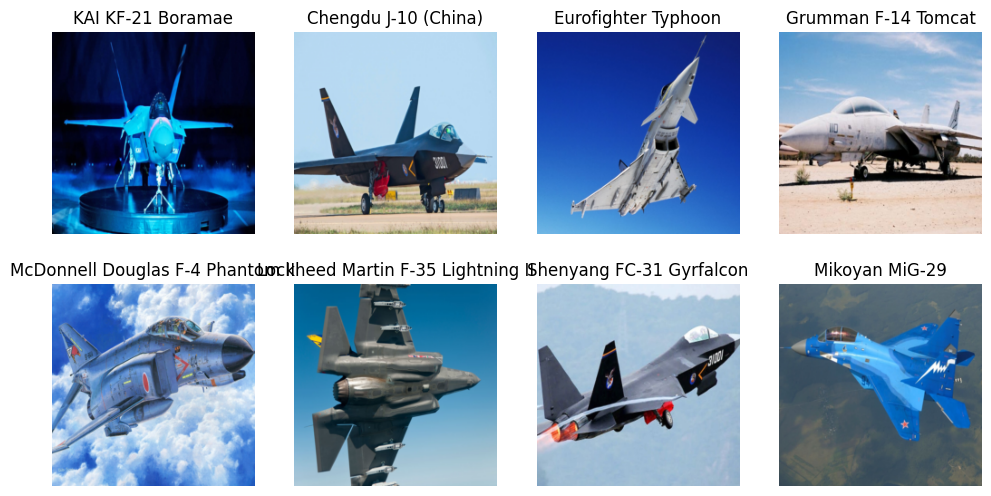

In [8]:
dls.valid.show_batch(max_n=8, nrows=2)

# Training and Data Cleaning

In [9]:
model_path = "models"

In [10]:
model = vision_learner(dls, resnet34, metrics=[error_rate,accuracy])

C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\ASUS\anaconda3\envs\Deep\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
model.fine_tune(0)

In [18]:
model.fine_tune(25)

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,3.504417,2.016767,0.564644,0.435356,05:10


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,2.323338,1.622336,0.440633,0.559367,07:24
1,1.843947,1.397109,0.393140,0.606860,06:28
2,1.555827,1.270358,0.340369,0.659631,06:25
3,1.244633,1.128178,0.311346,0.688654,06:15
4,1.013920,1.077346,0.282322,0.717678,06:13
5,0.830065,1.093316,0.308707,0.691293,06:13
6,0.743566,1.148539,0.274406,0.725594,06:14
7,0.623477,1.142020,0.274406,0.725594,06:15
8,0.580313,1.026763,0.242744,0.757256,06:20
9,0.443689,1.032187,0.261214,0.738786,06:16


In [21]:
model.save(f"lastModel")

Path('models/lastModel.pth')

In [22]:
model.load(f"models/lastModel")

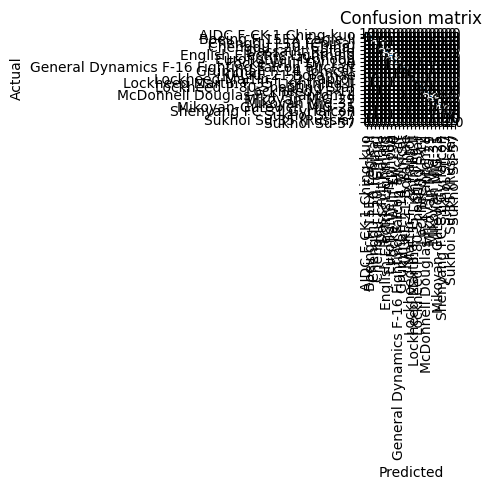

In [23]:
interp = ClassificationInterpretation.from_learner(model)
interp.plot_confusion_matrix()

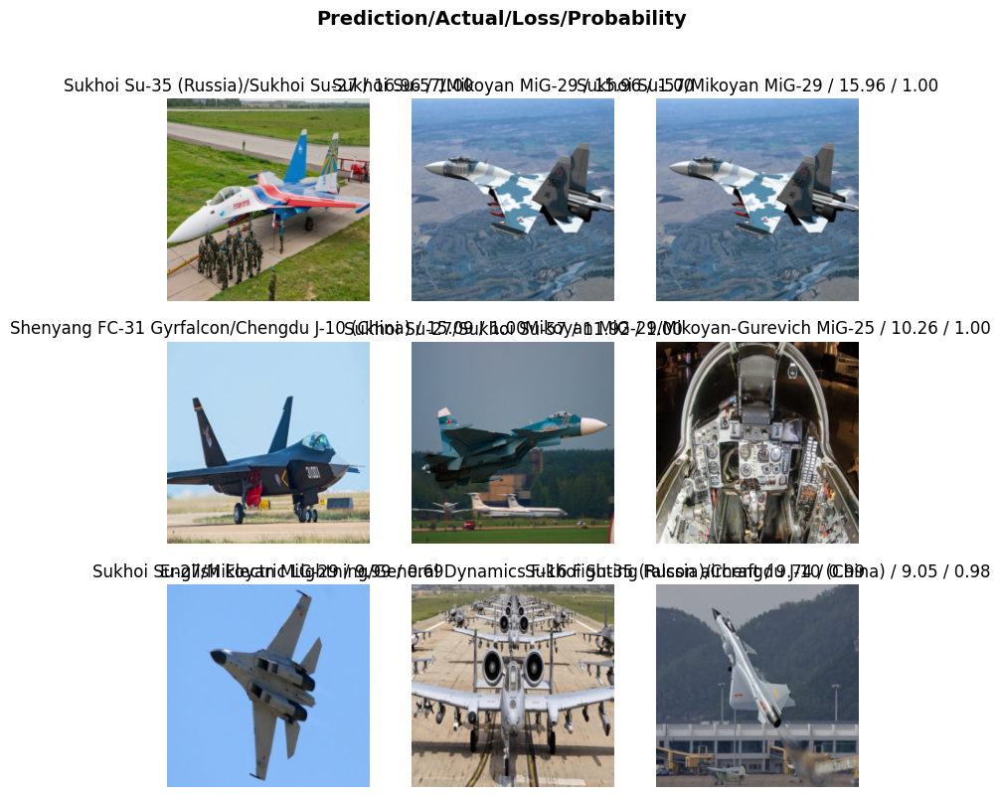

In [24]:
interp.plot_top_losses(9, nrows=3)

In [16]:
cleaner = ImageClassifierCleaner(model)
cleaner # flat cap, bucket hat, taqiyah cap

In [17]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()                                    # delete irrelevant data
for idx,cat in cleaner.change(): hutil.move(str(cleaner.fns[idx]), f"{data_path}/{cat}") # change the directory

# Export model for inference

In [25]:
model.export(f"models/latest.pkl")